# Acompanhamento e Analise do COVID 19 no Brasil
## Importação das Bibliotecas necessárias para as analises

* Fonte dos dados CSV.: https://brasil.io/dataset/covid19/caso?format=csv
* Fonte de dados API.: https://brasil.io/api/dataset/covid19/caso/data?format=json

In [ ]:
import requests
from pandas.io.json import json_normalize
import pandas as pd
from datetime import datetime
from matplotlib import pyplot as plt
import numpy as np
import folium
from folium import plugins

import sys
sys.setrecursionlimit(10000)


pd.set_option('display.max_colwidth', 1)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.float_format', '{:.2f}'.format)

def readUrl(url, params):
  if params:
    result = requests.get(url, params=params)
  else:
    result = requests.get(url)
  if result.status_code == 200:
    dictResult = result.json()

    if dictResult.get('results'):
      records = dictResult['results']
      df = pd.json_normalize(records)
    elif dictResult.get('value'):
      records = dictResult['value']
      df = pd.json_normalize(records)
    else:
      records = dictResult
      df = pd.json_normalize(records)
    
    return df
  else:
    result
    return result

def indicators(xs,ys,rotation):
  for x,y in zip(xs,ys):
    label = "{:}".format(y)
    plt.annotate(
        label,
        (x, y),
        textcoords="offset pixels",
        xytext=(0,5),
        ha="center",
        rotation=rotation,
        size=8
    )

#url = 'https://data.brasil.io/dataset/covid19/caso_full.csv.gz'
#df = pd.read_csv(url, sep=",", compression='gzip')

urlcsv = 'https://brasil.io/dataset/covid19/caso?format=csv'
covid = pd.read_csv(urlcsv)

urlibge = 'https://raw.githubusercontent.com/sandeco/CanalSandeco/master/covid-19/cidades_brasil.csv'
ibge = pd.read_csv(urlibge , )
#covid.columns = map(str.upper, covid.columns)

## Analisando DATASET Covid Brasil IO

In [ ]:
covid.head()

,date,state,city,place_type,confirmed,deaths,is_last,estimated_population_2019,city_ibge_code,confirmed_per_100k_inhabitants,death_rate
0,2020-06-03,AL,Água Branca,city,1,0,True,20196.00,2700102.00,4.95,0.00
1,2020-06-03,AL,Anadia,city,48,1,True,17545.00,2700201.00,273.58,0.02
2,2020-06-03,AL,Arapiraca,city,494,18,True,231747.00,2700300.00,213.16,0.04
3,2020-06-03,AL,Atalaia,city,209,5,True,47185.00,2700409.00,442.94,0.02
4,2020-06-03,AL,Barra de Santo Antônio,city,24,2,True,15932.00,2700508.00,150.64,0.08


## Analisando DATASET GITHUB IBGE

In [ ]:
ibge.head()

,codigo_ibge,nome,latitude,longitude,capital,codigo_uf
0,5200050,Abadia de Goiás,-16.76,-49.44,0,52
1,3100104,Abadia dos Dourados,-18.48,-47.39,0,31
2,5200100,Abadiânia,-16.20,-48.71,0,52
3,3100203,Abaeté,-19.16,-45.44,0,31
4,1500107,Abaetetuba,-1.72,-48.88,0,15


## Unificando os 2 DATASETS

In [ ]:
covidIbge = pd.merge(covid, ibge, left_on='city_ibge_code', right_on='codigo_ibge', how='left')

#paengaod os dados somente das cidades
cidades = covidIbge.query("place_type == 'city' & is_last == True")[['city','latitude','longitude','state','confirmed','deaths']]
cidades.head()

,city,latitude,longitude,state,confirmed,deaths
0,Água Branca,-9.26,-37.94,AL,1,0
1,Anadia,-9.68,-36.31,AL,48,1
2,Arapiraca,-9.75,-36.66,AL,494,18
3,Atalaia,-9.51,-36.01,AL,209,5
4,Barra de Santo Antônio,-9.40,-35.51,AL,24,2


In [ ]:
# filtrando com o LOC as colunas necessárias
#covidIbge.loc[(covidIbge.is_last == True) & (covidIbge.place_type == 'city'), ['state', 'city', 'latitude', 'longitude', 'confirmed', 'deaths']]

In [ ]:
len(cidades)

4377

In [ ]:
cidades.confirmed.sum()

581322

In [ ]:
display(len(cidades.state.unique()))
cidades.state.unique()
cidades = cidades.dropna()
cidades.head()

27

array(['AL', 'BA', 'CE', 'DF', 'ES', 'GO', 'MA', 'MG', 'MT', 'PB', 'PE',
       'PI', 'RJ', 'RS', 'SP', 'AC', 'AM', 'AP', 'MS', 'PA', 'PR', 'RN',
       'RO', 'RR', 'SC', 'SE', 'TO'], dtype=object)

In [ ]:
coor = cidades.loc[cidades.city == 'Americana'][['latitude', 'longitude', 'confirmed']].dropna()

len(coor)

1

## Plotando Mapa Folium

In [ ]:
# Criando o Mapa Base
baseMap = folium.Map(
    width="100%", height="100%", # pode ser determinado o tamanho 800 x 800 ou 100%
    #width=800, height=800, 
    location=[-15.788497, -47.879873],
    zoom_start=3
)

# adicionar heatmap
#baseMap = baseMap.add_child(plugins.HeatMap(coor))

# plotando o circle no mapa
for i in range(0,len(cidades)):
    folium.Circle(
        location=[cidades.iloc[i]['latitude'], cidades.iloc[i]['longitude']],
        color = 'crimson', fill = False,
        #color = '#3EF082',
        #fill  = '#1AA34E',
        tooltip= '<li><b> Estado.: '+ str(cidades.iloc[i]['state']) + '</li>' +
                 '<li><b> Cidade.: '+ str(cidades.iloc[i]['city']) + '</li>' +
                 '<li><b> Casos.: ' + str(cidades.iloc[i]['confirmed']) + '</li>' +
                 '<li><b> Mortes.: '+ str(cidades.iloc[i]['deaths']) + '</li>',
        radius = (cidades.iloc[i]['confirmed']**1.0)
    ).add_to(baseMap)


baseMap

In [ ]:
cidades.iloc[0]['latitude']

## Folium HeatMap

In [ ]:
# Cria o mapa zerado novamente
baseMap = folium.Map(
    width=800, height=800, # pode ser determinado o tamanho 800 x 800 ou 100%
    #width=800, height=800, 
    location=[-15.788497, -47.879873],
    zoom_start=4,
    tiles='Stamen Toner' #mapa branco e preto
    #tiles='Stamen Terrain' #mapa com o plano de terra
)

# Plugin FullScreen
plugins.Fullscreen(
    position='topright',
    title='Tela Cheia',
    title_cancel='Sair',
    force_separate_button=True
).add_to(baseMap)

# adicionar heatmap
baseMap = baseMap.add_child(plugins.HeatMap(coor))

# Interando os dados para pegar linha a linha
# plotando o circle no mapa
for i in range(0,len(cidades)):
    folium.Circle(
        location=[cidades.iloc[i]['latitude'], cidades.iloc[i]['longitude']],
        color = 'crimson', fill = False,
        #color = '#3EF082',
        #fill  = '#1AA34E',
        tooltip= '<li><b> Estado.: '+ str(cidades.iloc[i]['state']) + '</li>' +
                 '<li><b> Cidade.: '+ str(cidades.iloc[i]['city']) + '</li>' +
                 '<li><b> Casos.: ' + str(cidades.iloc[i]['confirmed']) + '</li>' +
                 '<li><b> Mortes.: '+ str(cidades.iloc[i]['deaths']) + '</li>',
        radius = (cidades.iloc[i]['confirmed']**1.0)
    ).add_to(baseMap)

baseMap

## Folium Marker Map

In [ ]:
# utilizando o Beuaify Icon

icon_plane = plugins.BeautifyIcon(
    icon='plane',
    border_color='#b3334f',
    text_color='#b3334f',
    icon_shape='triangle')

icon_number = plugins.BeautifyIcon(
    border_color='#00ABDC',
    text_color='#00ABDC',
    number=10,
    inner_icon_style='margin-top:0;')

In [ ]:
#t_list = ["Stamen Terrain", "Stamen Toner", "Mapbox Bright"]

# Zero o mapa novamente
baseMap = folium.Map(
    width="100%", height="100%", # pode ser determinado o tamanho 800 x 800 ou 100%
    location=[-22.5255255,-48.2304427],
    zoom_start=7,
    tiles="Stamen Toner"
)
# Plugin FullScreen
plugins.Fullscreen(
    position='topright',
    title='Tela Cheia',
    title_cancel='Sair',
    force_separate_button=True
).add_to(baseMap)


# plota pontos no mapa com as informacoes
for index,row in cidades.loc[cidades.state == 'SP'].iterrows():
    folium.Marker(
        location = [row['latitude'],row['longitude']],
        popup    = '<i> Casos - '+ str(row['confirmed']) + '</i>' + '<i> Mortes - ' + str(row['deaths']) + '</i>',
        tooltip  = str(row['city']),
        icon     = plugins.BeautifyIcon(
                            border_color='#00ABDC',
                            text_color='#00ABDC',
                            number=row['deaths'],
                            inner_icon_style='margin-top:0;')
    ).add_to(baseMap)
    

baseMap

## Folium MarkerCluster

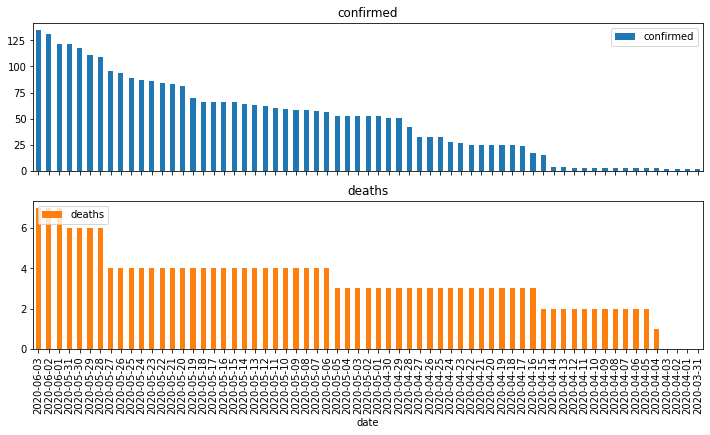

In [ ]:
americana = covid.loc[(covid.city == 'Americana'), ['date', 'confirmed', 'deaths'] ].plot(kind='bar', x='date', figsize=[12,6], subplots=True, rot=90)
americana[1].legend(loc=2)

In [ ]:

data = np.array(cidades[['latitude', 'longitude']])
popups = ['Mortos:'+ str(i) for i in cidades['deaths']] 


locationBrazil = [-15.788497, -47.879873]
baseMap = folium.Map(
    width=800,
    height=800,
    location=locationBrazil,
    tiles='Stamen Toner',
    zoom_start=4
)

plugins.MarkerCluster(data, 
                      popups = popups
                     ).add_to(baseMap)

baseMap

## Feature Group

In [ ]:
# Zero o mapa novamente
baseMap = folium.Map(
    width=800, height=800, # pode ser determinado o tamanho 800 x 800 ou 100%
    location=[-22.5255255,-48.2304427],
    zoom_start=3,
    tiles="Stamen Toner"
)
# Plugin FullScreen
plugins.Fullscreen(
    position='topright',
    title='Tela Cheia',
    title_cancel='Sair',
    force_separate_button=True
).add_to(baseMap)

#Group

for state in cidades['state'].unique():
    fg = folium.FeatureGroup(name= state).add_to(baseMap)
    
    for index, row in cidades.loc[cidades.state == state].iterrows():
        html = f"""
        <h4>{row['city']}</h4><br>
        <h5>Mortes: {row['deaths']}</h5>
        <h5>Casos: {row['confirmed']}</h5>
        """
        fg.add_child(folium.Marker(location=[row['latitude'],row['longitude']],popup= html))

baseMap.add_child(fg)

folium.LayerControl(collapsed=True).add_to(baseMap)

baseMap

In [ ]:
cidades